# STAT306 Final Group 19

# Data Description

In [5]:
# Library Imports
library(tidyverse)
library(corrplot)
library(ggplot2)
library(car)
library(GGally)
library(rsample)
library(caret)
library(patchwork)
library(leaps)

#if needed
#install.packages("corrplot", dependencies=TRUE, repos='http://cran.rstudio.com/')
# install.packages("leaps",  dependencies = TRUE, repos = "https://cloud.r-project.org/")
#install.packages("rsample", dependencies = TRUE, repos = "https://cloud.r-project.org/")
#install.packages("patchwork")

In [6]:
gym_membership_data <- read_csv("gym_members_exercise_tracking.csv")
head(gym_membership_data)

Rows: 973 Columns: 15
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (2): Gender, Workout_Type
dbl (13): Age, Weight (kg), Height (m), Max_BPM, Avg_BPM, Resting_BPM, Sessi...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


Age,Gender,Weight (kg),Height (m),Max_BPM,Avg_BPM,Resting_BPM,Session_Duration (hours),Calories_Burned,Workout_Type,Fat_Percentage,Water_Intake (liters),Workout_Frequency (days/week),Experience_Level,BMI
<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
56,Male,88.3,1.71,180,157,60,1.69,1313,Yoga,12.6,3.5,4,3,30.20
46,Female,74.9,1.53,179,151,66,1.30,883,HIIT,33.9,2.1,4,2,32.00
32,Female,68.1,1.66,167,122,54,1.11,677,Cardio,33.4,2.3,4,2,24.71
25,Male,53.2,1.70,190,164,56,0.59,532,Strength,28.8,2.1,3,1,18.41
38,Male,46.1,1.79,188,158,68,0.64,556,Strength,29.2,2.8,3,1,14.39
56,Female,58.0,1.68,168,156,74,1.59,1116,HIIT,15.5,2.7,5,3,20.55


In [7]:
num_cols <- ncol(gym_membership_data)
cat("This dataset has", num_cols ,"variables.")

This dataset has 15 variables.

In [8]:
n <- nrow(gym_membership_data)
cat("This dataset has", n ,"observations.")

This dataset has 973 observations.

| Variable | Description |
|----------|-------------|
| `Age` | Age of the gym member (years) |
| `Gender` | Gender of the gym member (Male or Female) |
| `Weight` | Member’s weight in kilograms (kg) |
| `Height` | Member’s height in meters (m) |
| `Max_BPM` | Maximum heart rate during workout sessions (beats per minute) |
| `Avg_BPM` | Average heart rate during workout sessions (beats per minute) |
| `Resting_BPM` | Heart rate at rest before workout (beats per minute) |
| `Session_Duration` | Duration of each workout session (hours) |
| `Calories_Burned` | Total calories burned during each session |
| `Workout_Type` | Type of workout performed (e.g., Cardio, Strength, Yoga, HIIT) |
| `Fat_Percentage` | Body fat percentage of the member (%) |
| `Water_Intake` | Daily water intake during workouts (liters) |
| `Workout_Frequency` | Number of workout sessions per week (days/week) |
| `Experience_Level` | Level of experience, from beginner (1) to expert (3) |
| `BMI` | Body Mass Index (Weight in kg / (Height in m)^2) |

# Questions for Investigation

## Insert text here


# Exploratory Data Analysis (EDA)

In [9]:
head(gym_membership_data, 10)

Age,Gender,Weight (kg),Height (m),Max_BPM,Avg_BPM,Resting_BPM,Session_Duration (hours),Calories_Burned,Workout_Type,Fat_Percentage,Water_Intake (liters),Workout_Frequency (days/week),Experience_Level,BMI
<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
56,Male,88.3,1.71,180,157,60,1.69,1313,Yoga,12.6,3.5,4,3,30.20
46,Female,74.9,1.53,179,151,66,1.30,883,HIIT,33.9,2.1,4,2,32.00
32,Female,68.1,1.66,167,122,54,1.11,677,Cardio,33.4,2.3,4,2,24.71
25,Male,53.2,1.70,190,164,56,0.59,532,Strength,28.8,2.1,3,1,18.41
38,Male,46.1,1.79,188,158,68,0.64,556,Strength,29.2,2.8,3,1,14.39
56,Female,58.0,1.68,168,156,74,1.59,1116,HIIT,15.5,2.7,5,3,20.55
36,Male,70.3,1.72,174,169,73,1.49,1385,Cardio,21.3,2.3,3,2,23.76
40,Female,69.7,1.51,189,141,64,1.27,895,Cardio,30.6,1.9,3,2,30.57
28,Male,121.7,1.94,185,127,52,1.03,719,Strength,28.9,2.6,4,2,32.34


In [10]:
gym_membership_data <- gym_membership_data %>%
  mutate(Gender = as.factor(Gender),
         Workout_Type = as.factor(Workout_Type),
         Experience_Level = as.factor(Experience_Level))

In [11]:
# check for NA
colSums(is.na(gym_membership_data))

Age                        Gender 
                            0                             0 
                  Weight (kg)                    Height (m) 
                            0                             0 
                      Max_BPM                       Avg_BPM 
                            0                             0 
                  Resting_BPM      Session_Duration (hours) 
                            0                             0 
              Calories_Burned                  Workout_Type 
                            0                             0 
               Fat_Percentage         Water_Intake (liters) 
                            0                             0 
Workout_Frequency (days/week)              Experience_Level 
                            0                             0 
                          BMI 
                            0

In [12]:
names(gym_membership_data) <- make.names(names(gym_membership_data))
colnames(gym_membership_data)

[1] "Age"                           "Gender"                       
 [3] "Weight..kg."                   "Height..m."                   
 [5] "Max_BPM"                       "Avg_BPM"                      
 [7] "Resting_BPM"                   "Session_Duration..hours."     
 [9] "Calories_Burned"               "Workout_Type"                 
[11] "Fat_Percentage"                "Water_Intake..liters."        
[13] "Workout_Frequency..days.week." "Experience_Level"             
[15] "BMI"

## Data Visualization

In [13]:
# gym_membership_pair_plots <- 
#     gym_membership_data %>%
#     ggpairs(progress = FALSE) +
#     ggtitle("Pairwise Plots of All Variables") +
#     theme(
#         plot.title = element_text(face = "bold", hjust = 0.5, size = 18),
#         text = element_text(size = 10),
#         axis.title = element_text(face = "bold")
#     ) 

# gym_membership_pair_plots

`geom_smooth()` using method = 'loess' and formula = 'y ~ x'


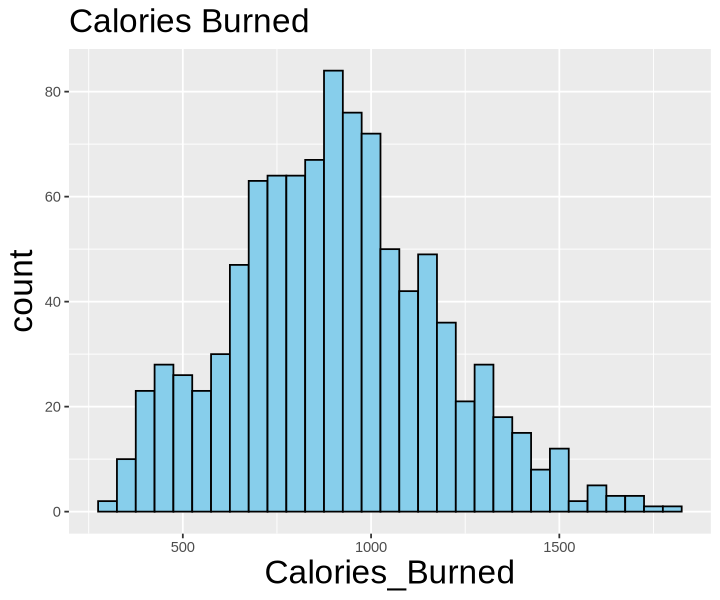

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


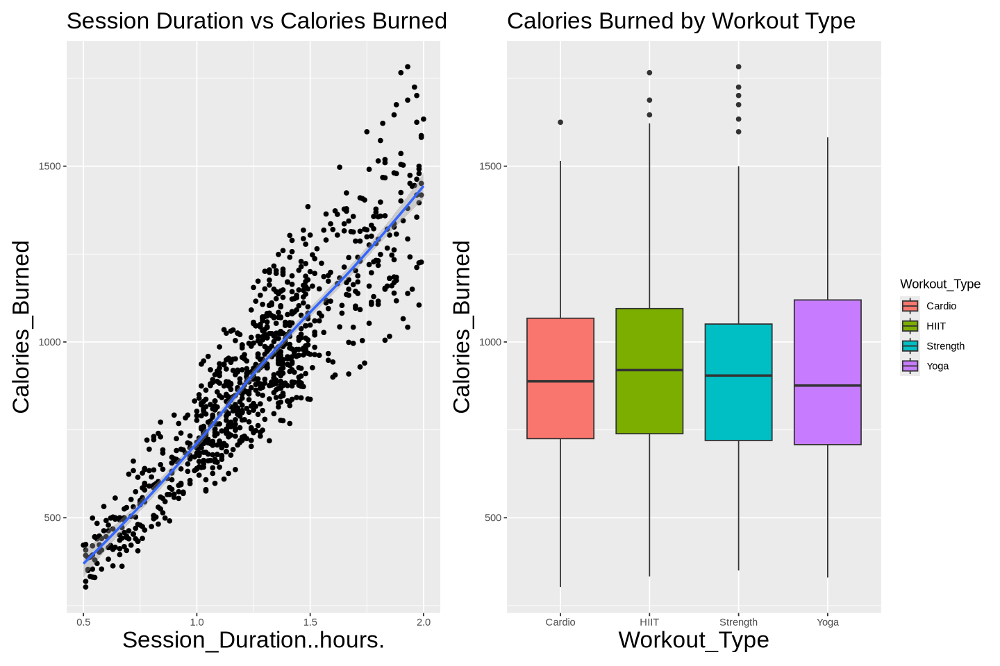

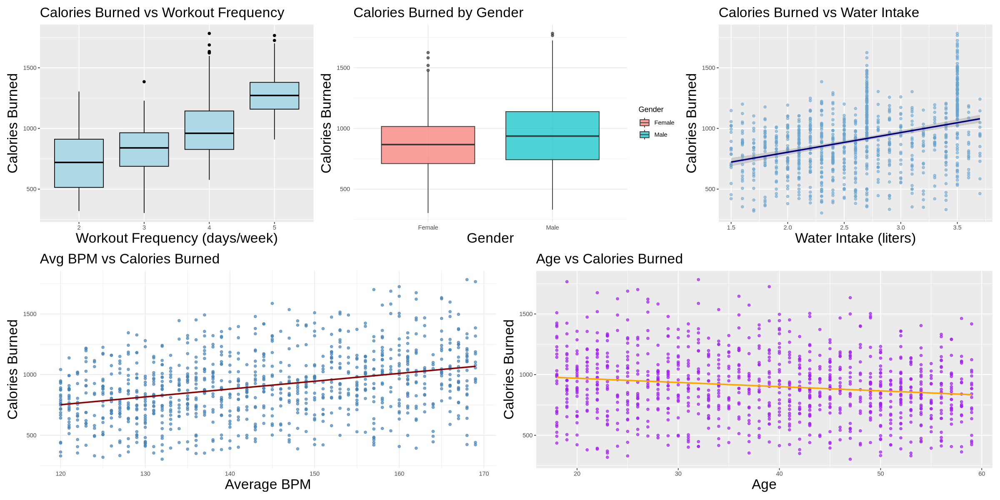

In [14]:
options(repr.plot.width = 6, repr.plot.height = 5)
calorie <- ggplot(gym_membership_data, aes(x = Calories_Burned)) +
  geom_histogram(binwidth = 50, fill = "skyblue", color = "black") +
  labs(title = "Calories Burned")+ 
    theme(plot.title = element_text(size = 20), 
    axis.title.x = element_text(size = 20),
    axis.title.y = element_text(size = 20) )

wtype <- ggplot(gym_membership_data, aes(x = Workout_Type, y = Calories_Burned, fill = Workout_Type)) +
  geom_boxplot() +
  labs(title = "Calories Burned by Workout Type")+ 
    theme(plot.title = element_text(size = 20), 
    axis.title.x = element_text(size = 20),
    axis.title.y = element_text(size = 20) )
duration <- ggplot(gym_membership_data, aes(x = Session_Duration..hours., y = Calories_Burned)) +
  geom_point() +
  geom_smooth() +
  labs(title = "Session Duration vs Calories Burned")+ 
    theme(plot.title = element_text(size = 20), 
    axis.title.x = element_text(size = 20),
    axis.title.y = element_text(size = 20) )

gender <- ggplot(gym_membership_data, aes(x = Gender, y = Calories_Burned, fill = Gender)) +
  geom_boxplot(alpha = 0.7) +
  labs(title = "Calories Burned by Gender", x = "Gender", y = "Calories Burned") +
  theme_minimal()+ 
    theme(plot.title = element_text(size = 20), 
    axis.title.x = element_text(size = 20),
    axis.title.y = element_text(size = 20) )
avg_bpm <- ggplot(gym_membership_data, aes(x = Avg_BPM, y = Calories_Burned)) +
  geom_point(color = "steelblue", alpha = 0.7) +
  geom_smooth(method = "lm", color = "darkred", se = FALSE) +
  labs(title = "Avg BPM vs Calories Burned", x = "Average BPM", y = "Calories Burned") +
  theme_minimal()+ 
    theme(plot.title = element_text(size = 20), 
    axis.title.x = element_text(size = 20),
    axis.title.y = element_text(size = 20) )
rest_bpm <- ggplot(gym_membership_data, aes(x = Resting_BPM, y = Calories_Burned)) +
  geom_point(color = "darkgreen", alpha = 0.7) +
  geom_smooth(method = "lm", color = "black", se = FALSE) +
  labs(title = "Resting BPM vs Calories Burned", x = "Resting BPM", y = "Calories Burned") +
  theme_minimal()+ 
    theme(plot.title = element_text(size = 20), 
    axis.title.x = element_text(size = 20),
    axis.title.y = element_text(size = 20) )

age <- ggplot(gym_membership_data, aes(x = Age, y = Calories_Burned)) +
  geom_point(color = "purple", alpha = 0.7) +
  geom_smooth(method = "lm", color = "orange", se = FALSE) +
  labs(title = "Age vs Calories Burned", x = "Age", y = "Calories Burned") + 
    theme(plot.title = element_text(size = 20), 
    axis.title.x = element_text(size = 20),
    axis.title.y = element_text(size = 20) )

freq <- ggplot(gym_membership_data, aes(x = factor(Workout_Frequency..days.week.), y = Calories_Burned)) +
  geom_boxplot(fill = "lightblue", color = "black") +
  labs(title = "Calories Burned vs Workout Frequency", x = "Workout Frequency (days/week)", y = "Calories Burned") + 
    theme(plot.title = element_text(size = 20), 
    axis.title.x = element_text(size = 20),
    axis.title.y = element_text(size = 20) )

water <- ggplot(gym_membership_data, aes(x = Water_Intake..liters., y = Calories_Burned)) +
  geom_point(alpha = 0.6, color = "skyblue3") +
  geom_smooth(method = "lm", color = "navy") +
  labs(title = "Calories Burned vs Water Intake", x = "Water Intake (liters)", y = "Calories Burned")+ 
    theme(plot.title = element_text(size = 20), 
    axis.title.x = element_text(size = 20),
    axis.title.y = element_text(size = 20) )

calorie
options(repr.plot.width = 12, repr.plot.height = 8)
(duration |wtype)
options(repr.plot.width = 20, repr.plot.height = 10)
(freq | gender | water)/(avg_bpm | age)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


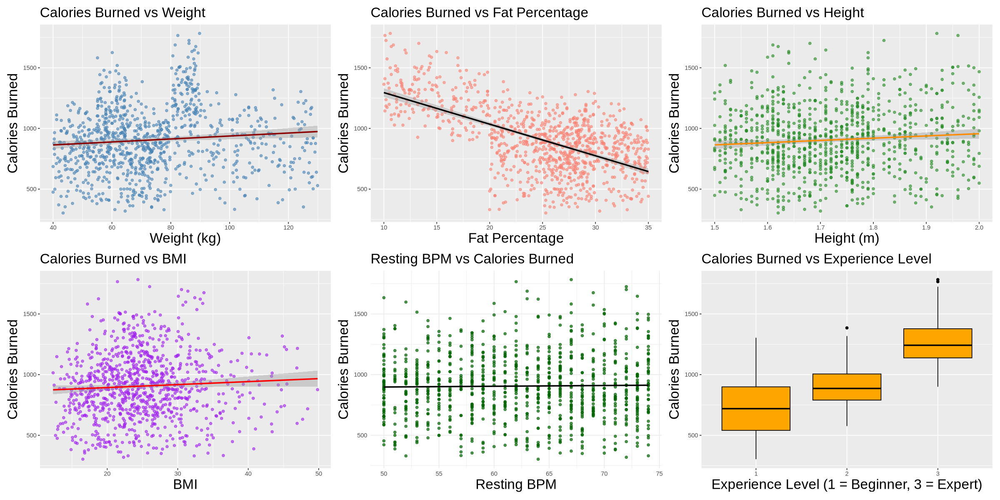

In [15]:
weight <- ggplot(gym_membership_data, aes(x = Weight..kg., y = Calories_Burned)) +
  geom_point(alpha = 0.6, color = "steelblue") +
  geom_smooth(method = "lm", se = TRUE, color = "darkred") +
  labs(title = "Calories Burned vs Weight", x = "Weight (kg)", y = "Calories Burned")+ 
    theme(plot.title = element_text(size = 20), 
    axis.title.x = element_text(size = 20),
    axis.title.y = element_text(size = 20) )

height <- ggplot(gym_membership_data, aes(x = Height..m., y = Calories_Burned)) +
  geom_point(alpha = 0.6, color = "forestgreen") +
  geom_smooth(method = "lm", color = "darkorange") +
  labs(title = "Calories Burned vs Height", x = "Height (m)", y = "Calories Burned")+ 
    theme(plot.title = element_text(size = 20), 
    axis.title.x = element_text(size = 20),
    axis.title.y = element_text(size = 20) )

bmi <- ggplot(gym_membership_data, aes(x = BMI, y = Calories_Burned)) +
  geom_point(alpha = 0.6, color = "purple") +
  geom_smooth(method = "lm", color = "red") +
  labs(title = "Calories Burned vs BMI", x = "BMI", y = "Calories Burned")+ 
    theme(plot.title = element_text(size = 20), 
    axis.title.x = element_text(size = 20),
    axis.title.y = element_text(size = 20) )


fat <- ggplot(gym_membership_data, aes(x = Fat_Percentage, y = Calories_Burned)) +
  geom_point(alpha = 0.6, color = "salmon") +
  geom_smooth(method = "lm", color = "black") +
  labs(title = "Calories Burned vs Fat Percentage", x = "Fat Percentage", y = "Calories Burned")+ 
    theme(plot.title = element_text(size = 20), 
    axis.title.x = element_text(size = 20),
    axis.title.y = element_text(size = 20) )

exp <- ggplot(gym_membership_data, aes(x = factor(Experience_Level), y = Calories_Burned)) +
  geom_boxplot(fill = "orange", color = "black") +
  labs(title = "Calories Burned vs Experience Level", x = "Experience Level (1 = Beginner, 3 = Expert)", y = "Calories Burned")+ 
    theme(plot.title = element_text(size = 20), 
    axis.title.x = element_text(size = 20),
    axis.title.y = element_text(size = 20) )


options(repr.plot.width = 20, repr.plot.height = 10)
(weight | fat | height )/(bmi | rest_bpm | exp)

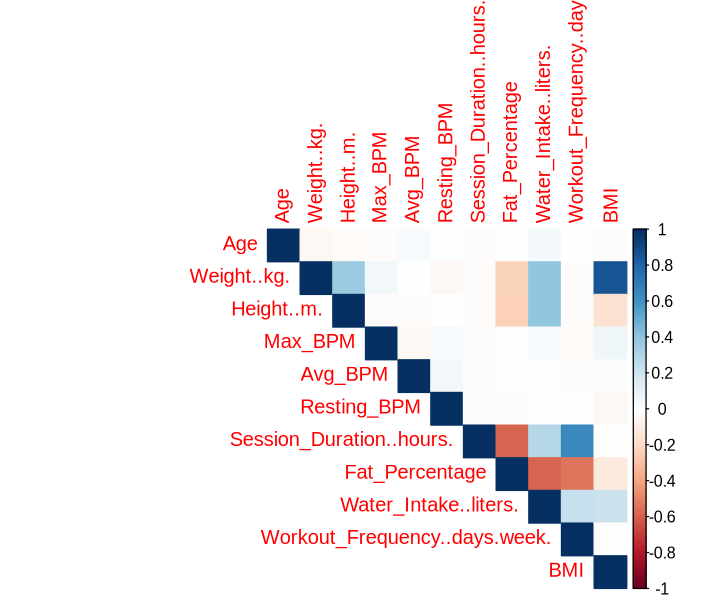

In [16]:
# Correlation matrix for numeric variables
options(repr.plot.width = 6, repr.plot.height = 5)
num_vars <- gym_membership_data %>% 
    select(where(is.numeric)) %>% 
    select(-Calories_Burned)
corrplot(cor(num_vars), method = "color", type = "upper")

# Model Selection

In [28]:
split <- initial_split(gym_membership_data, prop = 0.7)
gym_membership_train <- training(split)
gym_membership_test <- testing(split)

In [29]:
base_model <- lm(Calories_Burned ~ ., data = gym_membership_train)
summary(base_model)


Call:
lm(formula = Calories_Burned ~ ., data = gym_membership_train)

Residuals:
     Min       1Q   Median       3Q      Max 
-124.619  -24.481   -1.933   21.843  178.337 

Coefficients:
                                Estimate Std. Error t value Pr(>|t|)    
(Intercept)                   -1.081e+03  1.109e+02  -9.744   <2e-16 ***
Age                           -3.375e+00  1.257e-01 -26.856   <2e-16 ***
GenderMale                     8.314e+01  6.430e+00  12.931   <2e-16 ***
Weight..kg.                   -1.349e+00  6.447e-01  -2.093   0.0368 *  
Height..m.                     1.413e+02  5.996e+01   2.357   0.0187 *  
Max_BPM                        8.032e-02  1.312e-01   0.612   0.5406    
Avg_BPM                        6.154e+00  1.074e-01  57.311   <2e-16 ***
Resting_BPM                    3.768e-01  2.090e-01   1.803   0.0718 .  
Session_Duration..hours.       7.131e+02  7.085e+00 100.654   <2e-16 ***
Workout_TypeHIIT              -3.082e-01  4.269e+00  -0.072   0.9425    
Workout_

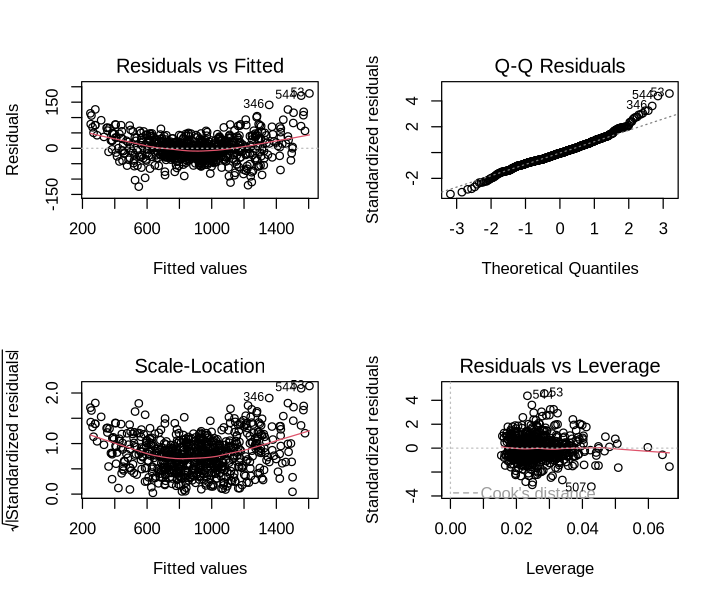

In [30]:
par(mfrow = c(2, 2))
plot(base_model)
par(mfrow = c(1,1))

In [31]:
vif(base_model)

,GVIF,Df,GVIF^(1/(2*Df))
Age,1.030524,1,1.015147
Gender,4.487351,1,2.118337
Weight..kg.,80.625881,1,8.979192
Height..m.,24.465154,1,4.946226
Max_BPM,1.025602,1,1.012720
Avg_BPM,1.015831,1,1.007884
Resting_BPM,1.023673,1,1.011767
Session_Duration..hours.,2.638688,1,1.624404
Workout_Type,1.056025,3,1.009127
Fat_Percentage,5.470077,1,2.338820


In [32]:
# Assume df is your dataframe
model <- regsubsets(Calories_Burned ~ Age + Gender + Weight..kg. + Height..m. + Max_BPM +
                    Avg_BPM + Resting_BPM + Session_Duration..hours. + Workout_Type +
                    Fat_Percentage + Water_Intake..liters. + Workout_Frequency..days.week. +
                    Experience_Level + BMI, 
                    data = gym_membership_train, nvmax = 14)

summary(model)

Subset selection object
Call: regsubsets.formula(Calories_Burned ~ Age + Gender + Weight..kg. + 
    Height..m. + Max_BPM + Avg_BPM + Resting_BPM + Session_Duration..hours. + 
    Workout_Type + Fat_Percentage + Water_Intake..liters. + Workout_Frequency..days.week. + 
    Experience_Level + BMI, data = gym_membership_train, nvmax = 14)
17 Variables  (and intercept)
                              Forced in Forced out
Age                               FALSE      FALSE
GenderMale                        FALSE      FALSE
Weight..kg.                       FALSE      FALSE
Height..m.                        FALSE      FALSE
Max_BPM                           FALSE      FALSE
Avg_BPM                           FALSE      FALSE
Resting_BPM                       FALSE      FALSE
Session_Duration..hours.          FALSE      FALSE
Workout_TypeHIIT                  FALSE      FALSE
Workout_TypeStrength              FALSE      FALSE
Workout_TypeYoga                  FALSE      FALSE
Fat_Percentage      

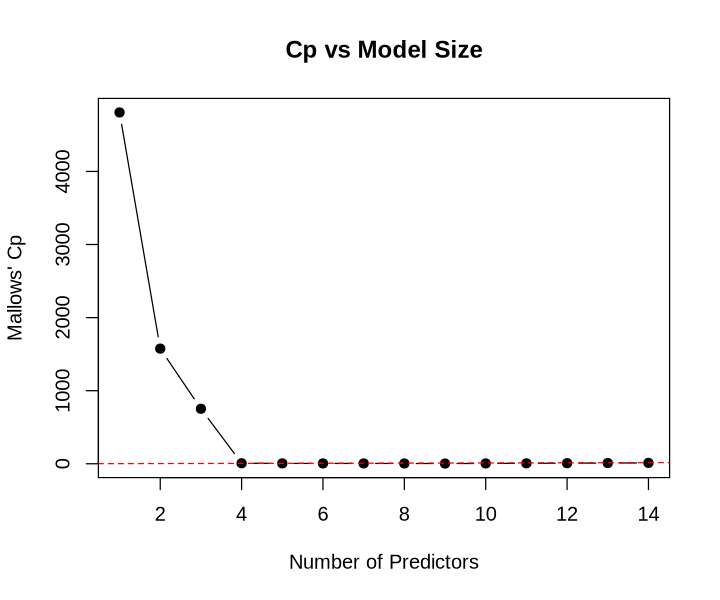

In [33]:
model_summary <- summary(model)

plot(model_summary$cp,
     xlab = "Number of Predictors",
     ylab = "Mallows' Cp",
     type = "b",
     pch = 19,
     main = "Cp vs Model Size")

abline(a = 1, b = 1, col = "red", lty = 2)

In [34]:
metrics_df <- data.frame(
  Model_Size = 1:length(model_summary$rsq),
  R2 = model_summary$rsq,
  Adjusted_R2 = model_summary$adjr2,
  Cp = model_summary$cp
)

print(metrics_df)

   Model_Size        R2 Adjusted_R2          Cp
1           1 0.8295643   0.8293133 4807.204338
2           2 0.9300524   0.9298460 1575.744036
3           3 0.9557016   0.9555053  752.414048
4           4 0.9789212   0.9787965    7.264942
5           5 0.9790409   0.9788857    5.411132
6           6 0.9791192   0.9789334    4.891701
7           7 0.9791851   0.9789686    4.772450
8           8 0.9792729   0.9790262    3.947037
9           9 0.9793631   0.9790863    3.044113
10         10 0.9793750   0.9790671    4.663235
11         11 0.9793867   0.9790478    6.285442
12         12 0.9793908   0.9790206    8.152183
13         13 0.9793933   0.9789917   10.072711
14         14 0.9793942   0.9789610   12.045034


In [48]:
best_lm <- lm(Calories_Burned ~ Session_Duration..hours. + Avg_BPM + Resting_BPM + Gender +
                  Age + Workout_Type, data = gym_membership_train)
pred_best_lm <- predict(best_lm, newdata = gym_membership_test)

base_lm <- lm(Calories_Burned ~ .,
                    data = gym_membership_train)
base_summary <- summary(base_lm)

base_summary <- summary(base_lm)
best_summary <- summary(best_lm)


In [49]:
comparison <- data.frame(
  Model = c("Base", "Best"),
  R_squared = c(base_summary$r.squared, best_summary$r.squared),
  Adjusted_R_squared = c(base_summary$adj.r.squared, best_summary$adj.r.squared),
  RMSE = c(
    sqrt(mean((gym_membership_test$Calories_Burned - pred_base_lm)^2)),
    sqrt(mean((gym_membership_test$Calories_Burned - pred_best_lm)^2))
  )
)
comparison

Model,R_squared,Adjusted_R_squared,RMSE
<chr>,<dbl>,<dbl>,<dbl>
Base,0.9793956,0.9788673,39.72630
Best,0.9791245,0.9788760,39.68309


# Using Extended Model

In [40]:
# Base Model (again)
base_lm <- lm(Calories_Burned ~ .,
                    data = gym_membership_train)

pred_base_lm <- predict(base_lm, newdata = gym_membership_test)


In [23]:
extended_lm <- lm(Calories_Burned ~ Session_Duration..hours. + Avg_BPM + Gender +
                  Age + Workout_Type, data = gym_membership_train)
pred_extended_lm <- predict(extended_lm, newdata = gym_membership_test)

In [24]:
base_summary <- summary(base_lm)
extended_summary <- summary(extended_lm)

comparison <- data.frame(
  Model = c("Base", "Extended"),
  R_squared = c(base_summary$r.squared, extended_summary$r.squared),
  Adjusted_R_squared = c(base_summary$adj.r.squared, extended_summary$adj.r.squared),
  RMSE = c(
    sqrt(mean((gym_membership_test$Calories_Burned - pred_base_lm)^2)),
    sqrt(mean((gym_membership_test$Calories_Burned - pred_extended_lm)^2))
  )
)
comparison

Model,R_squared,Adjusted_R_squared,RMSE
<chr>,<dbl>,<dbl>,<dbl>
Base,0.9791040,0.9785682,40.13641
Extended,0.9786393,0.9784172,40.11033


In [23]:
importance <- varImp(extended_lm)
print(importance)

                              Overall
Session_Duration..hours. 160.19311989
Avg_BPM                   58.28882996
GenderMale                28.61681854
Age                       26.69112199
Workout_TypeHIIT           0.12307102
Workout_TypeStrength       0.09599847
Workout_TypeYoga           1.61338521


In [24]:
vif(extended_lm)

,GVIF,Df,GVIF^(1/(2*Df))
Session_Duration..hours.,1.013743,1,1.006848
Avg_BPM,1.002150,1,1.001074
Gender,1.003532,1,1.001765
Age,1.005965,1,1.002978
Workout_Type,1.021775,3,1.003597


In [ ]:
## SEIF

In [ ]:
base_lm <- lm(Calories_Burned ~ Session_Duration..hours. + Workout_Type + Workout_Frequency..days.week. + Gender + Water_Intake..liters. + Avg_BPM + Age, data = gym_membership_data)
summary(base_lm)

In [ ]:
qqnorm(residuals(base_lm))
qqline(residuals(base_lm), col = "red")

plot(fitted(base_lm), residuals(base_lm),
     xlab = "Fitted values", ylab = "Residuals",
     main = "Residuals vs Fitted")
abline(h = 0, col = "red")

In [ ]:
null_model <- lm(Calories_Burned ~ 1, data = gym_membership_data)

full_model <- lm(Calories_Burned ~ 
  Workout_Type * Avg_BPM + 
  Workout_Type * Session_Duration..hours. + 
  Gender * Avg_BPM + 
  Gender * Age + 
  Water_Intake..liters. +
  I(Workout_Frequency..days.week.^2) +
  I(Avg_BPM^2) +
  I(Age^2),
  data = gym_membership_data)

forward_model <- step(null_model, 
                      scope = formula(full_model), 
                      direction = "forward")
summary(forward_model)

In [ ]:
stepwise_model <- step(full_model, direction = "both", trace = FALSE)
summary(stepwise_model)

In [ ]:
qqnorm(residuals(forward_model))
qqline(residuals(forward_model), col = "red")

In [ ]:
plot(fitted(forward_model), residuals(forward_model),
     xlab = "Fitted values", ylab = "Residuals",
     main = "Residuals vs Fitted")
abline(h = 0, col = "red")